**Segmentação da região de interesse em imagens termográficas da mama utilizando redes profundas**

** As saídas salvas mostram um exemplo de uma execução

## 📁 Arquivos Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 📚 Bibliotecas

In [2]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album

In [3]:
!pip install -q -U segmentation-models-pytorch albumentations > /dev/null

In [4]:
import segmentation_models_pytorch as smp

In [5]:
from segmentation_models_pytorch import utils

## 🗃️ Diretórios com o Dataset

In [6]:
# Diretório com imagens de treino
x_train_dir = 'drive/MyDrive/TCC/Dataset/train'
y_train_dir = 'drive/MyDrive/TCC/Dataset/train_gt'

# Diretório com imagens de validação
x_valid_dir = 'drive/MyDrive/TCC/Dataset/val'
y_valid_dir = 'drive/MyDrive/TCC/Dataset/val_gt'

# Diretório com imagens de teste
x_test_dir = 'drive/MyDrive/TCC/Dataset/test'
y_test_dir = 'drive/MyDrive/TCC/Dataset/test_gt'

In [7]:
# Nome das classes
class_names = ['breast']

# Valor da classe breast na imagem da gt importada da base
breast_gt_value = 255

## Função para visualização de imagem

In [8]:
def visualize(**images):
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]);
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image, 'gray')
    plt.show()

## Classe Dataset

In [9]:
class Dataset(torch.utils.data.Dataset):

    """Lê imagens, aplica augmentation e preprocessa transformações.

    Args:
        images_dir (str): caminho para a pasta com as imagens
        masks_dir (str): caminho para a pasta com as máscaras de segmentação
        augmentation (albumentations.Compose): pipeline de transformação de dados
        preprocessing (albumentations.Compose): processamento de dados

    """

    def __init__(
            self,
            images_dir,
            masks_dir,
            augmentation=None,
            preprocessing=None,
    ):

        # Lista com os caminhos para as imagens
        self.image_paths = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
        # Lista com os caminhos para as máscaras de segmentações
        self.mask_paths = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]

        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __getitem__(self, i):

        # Lê imagens e máscaras de segmentação
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)

        mask = cv2.imread(self.mask_paths[i], 0)

        # Extrai a classe 'breast'
        masks = [(mask == 255)]
        mask = np.stack(masks, axis=-1).astype('float')

        # Aplica augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        # Aplica preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        # Retorna o tamanho
        return len(self.image_paths)

## Definindo Augmentations

In [10]:
def get_training_augmentation():
    train_transform = [
        album.Rotate(limit=(10,20), p=0.5, border_mode=0),
    ]
    return album.Compose(train_transform)

In [11]:
def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')

In [12]:
def get_preprocessing(preprocessing_fn=None):
    """Construir transformação de pré-processamento
    Args:
        preprocessing_fn (callable): função de normalização de dados
    Return:
        transform: albumentations.Compose
    """
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))

    return album.Compose(_transform)

## Visualizando Augmentations

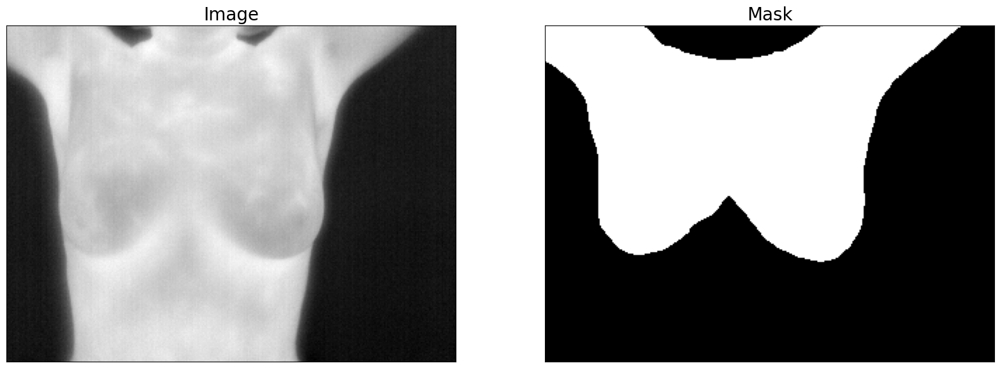

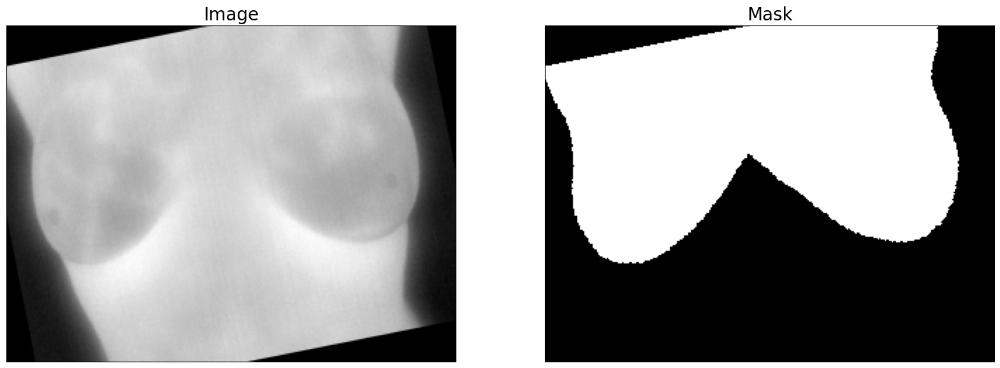

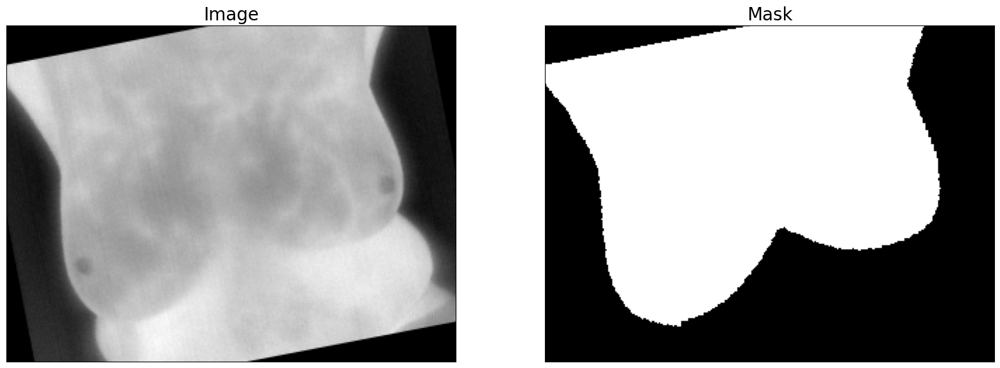

In [13]:
augmented_dataset = Dataset(
    x_train_dir,
    y_train_dir,
    augmentation=get_training_augmentation(),
)

for i in range(3):
    image, mask = augmented_dataset[i]
    visualize(image=image, mask=mask)

## Definição do modelo

In [14]:
ENCODER = 'resnet101'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = class_names
ACTIVATION = 'sigmoid'

# Cria modelo de segmentação com codificador pre-treinado
model = smp.DeepLabV3Plus(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    classes=len(CLASSES),
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:02<00:00, 79.8MB/s]


## Obtém Dataloaders de Treino e Validação

In [15]:
train_dataset = Dataset(
    x_train_dir, y_train_dir,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=5)

In [16]:
valid_dataset = Dataset(
    x_valid_dir, y_valid_dir,
    preprocessing=get_preprocessing(preprocessing_fn),
)

valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=2)

## Ajusta Hiperparâmetros

In [17]:
# Aloca Flag para treinar ou não o modelo
# Se for 'False', apenas prredições são realizadas (usando um ponto de verificação de modelo mais antigo)
TRAINING = True

# Número de épocas
EPOCHS = 30

# Device: `cuda` or `cpu`
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define função de perda
loss = smp.utils.losses.DiceLoss()

# Define métricas
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Accuracy(threshold=0.5),
    smp.utils.metrics.Precision(threshold=0.5),
]

# Define otimizador
optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.0001),
])

## Módulo de treino

In [18]:
train_epoch = smp.utils.train.TrainEpoch(
    model,
    loss=loss,
    metrics=metrics,
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

In [19]:
valid_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
    verbose=True,
)

## Treinando o modelo

In [20]:
%%time

if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Realiza treino e validação
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Salva o modelo se um melhor valor de IoU for obtido
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, f'./best_model.pth')
            print('Model saved!')


Epoch: 0
valid: 100%|██████████| 28/28 [00:10<00:00,  2.55it/s, dice_loss - 0.4903, iou_score - 0.8722, accuracy - 0.9339, precision - 0.8844]
Model saved!

Epoch: 1
valid: 100%|██████████| 28/28 [00:01<00:00, 27.93it/s, dice_loss - 0.3139, iou_score - 0.8906, accuracy - 0.9438, precision - 0.8927]
Model saved!

Epoch: 2
valid: 100%|██████████| 28/28 [00:01<00:00, 27.49it/s, dice_loss - 0.1444, iou_score - 0.9082, accuracy - 0.9537, precision - 0.9092]
Model saved!

Epoch: 3
valid: 100%|██████████| 28/28 [00:01<00:00, 22.31it/s, dice_loss - 0.08076, iou_score - 0.937, accuracy - 0.9693, precision - 0.9426]
Model saved!

Epoch: 4
valid: 100%|██████████| 28/28 [00:00<00:00, 28.07it/s, dice_loss - 0.05814, iou_score - 0.9513, accuracy - 0.9766, precision - 0.9552]
Model saved!

Epoch: 5
valid: 100%|██████████| 28/28 [00:01<00:00, 27.60it/s, dice_loss - 0.04958, iou_score - 0.9556, accuracy - 0.9788, precision - 0.9589]
Model saved!

Epoch: 6
valid: 100%|██████████| 28/28 [00:01<00:00, 20

## Carrega o melhor modelo



In [21]:
# Carrega o melhor modelo dessa execução
if os.path.exists('./best_model.pth'):
    best_model = torch.load('./best_model.pth', map_location=DEVICE)
    print('Modelo DeepLabV3+ desta execução.')

Modelo DeepLabV3+ desta execução.


## Avaliação do modelo no Dataset de teste





In [22]:
test_dataset = Dataset(
    x_test_dir,
    y_test_dir,
    preprocessing=get_preprocessing(preprocessing_fn),
)

test_dataloader = DataLoader(test_dataset)

In [23]:
test_epoch = smp.utils.train.ValidEpoch(
    best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
    verbose=True,
)

In [24]:
test_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean Accuracy: {test_logs['accuracy']:.4f}")
print(f"Mean IoU Score: {test_logs['iou_score']:.4f}")
print(f"Mean Precision Score: {test_logs['precision']:.4f}")
print(f"Mean Dice Loss: {test_logs['dice_loss']:.4f}")

valid: 100%|██████████| 56/56 [00:43<00:00,  1.29it/s, dice_loss - 0.02125, iou_score - 0.9706, accuracy - 0.9863, precision - 0.9811]
Evaluation on Test Data: 
Mean Accuracy: 0.9863
Mean IoU Score: 0.9706
Mean Precision Score: 0.9811
Mean Dice Loss: 0.0213


In [25]:
# Salva o modelo
torch.save(model, f"./test_{test_logs['accuracy']:.4f}acc_{test_logs['iou_score']:.4f}_iou.pth")

## Predições no Dataset de Teste

In [26]:
# Teste Dataset para visualização (sem pre-processamento)
test_dataset_vis = Dataset(
    x_test_dir, y_test_dir,
)

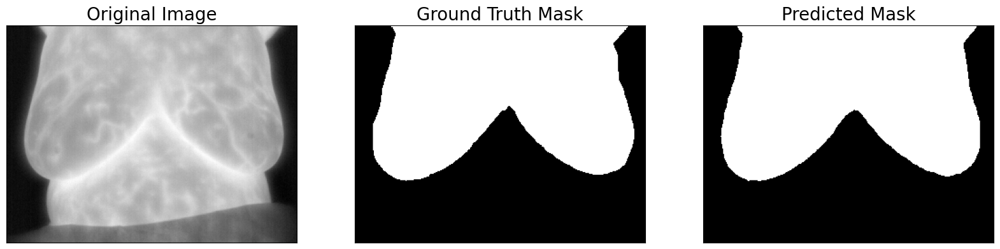

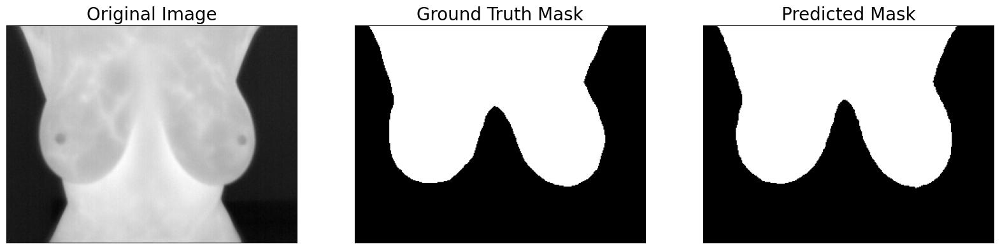

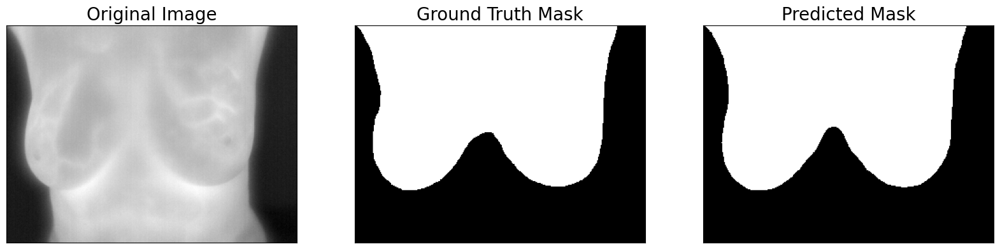

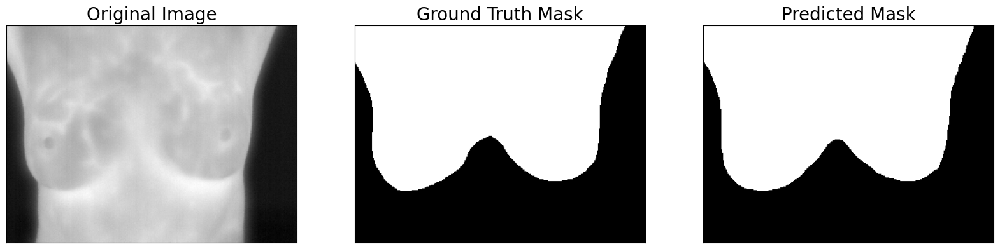

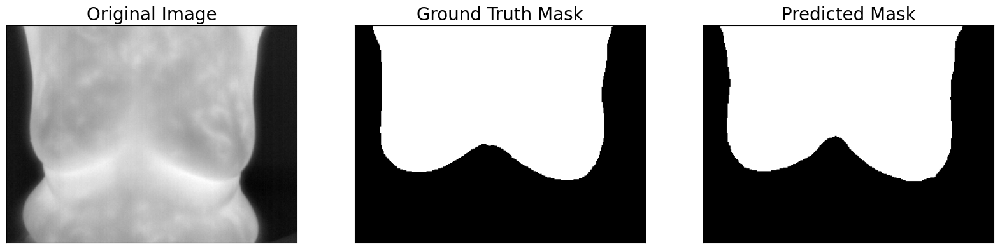

...

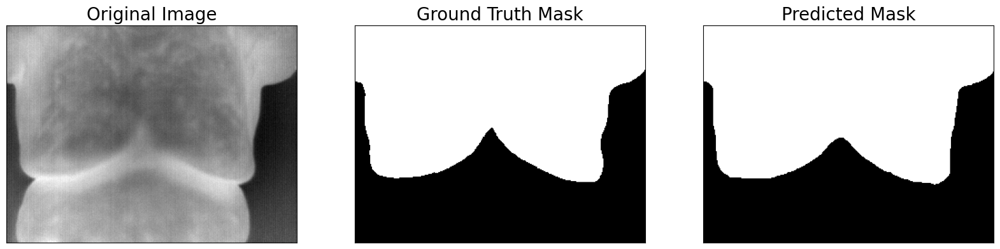

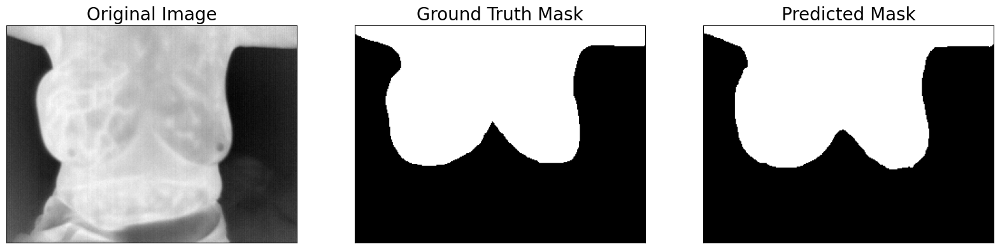

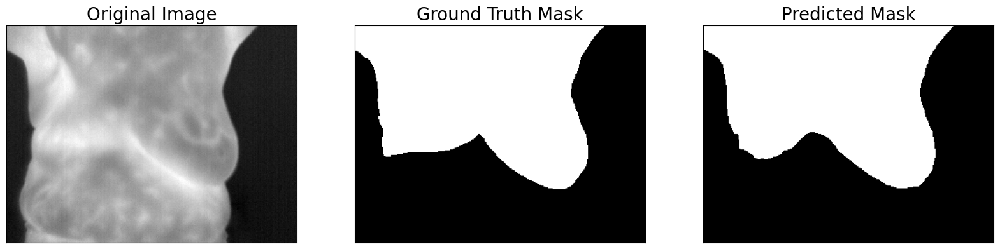

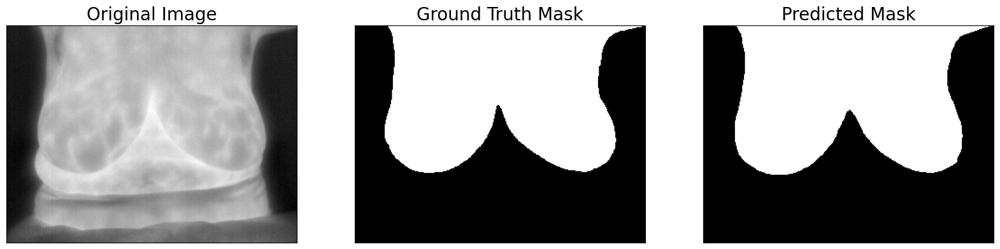

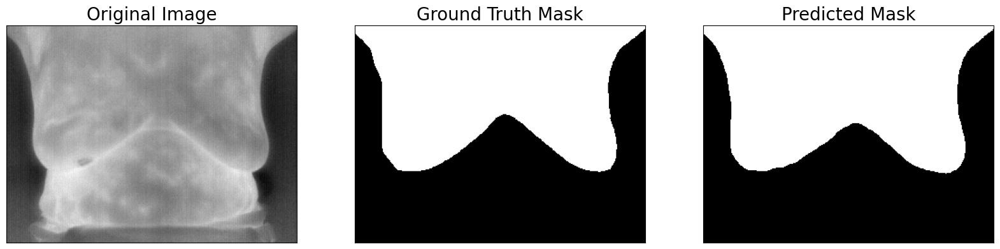

In [27]:
best_model.eval()
for idx in range(len(test_dataset)):

    image, gt_mask = test_dataset[idx]
    image_vis = test_dataset_vis[idx][0].astype('uint8')
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)

    gt_mask = gt_mask.squeeze()

    # Predição da imagem de teste
    pred_mask = best_model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy().round()

    visualize(
        original_image = image_vis,
        ground_truth_mask = gt_mask,
        predicted_mask = pred_mask
    )

# Plot Treino x Validação
(Não entra na publicação do código, apenas observando)
(Pois, para o final será construído um gráfico das 10 execuções para tirar a média dos valores de teste)

In [28]:
train_logs_df = pd.DataFrame(train_logs_list)
valid_logs_df = pd.DataFrame(valid_logs_list)

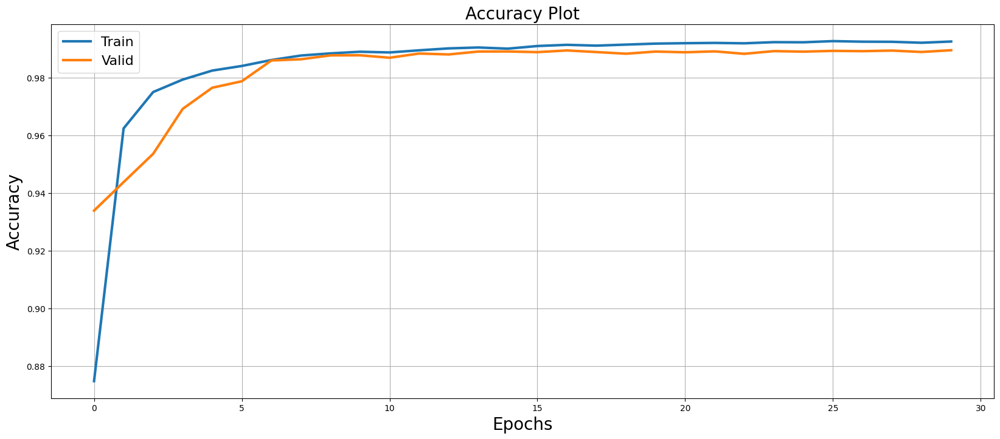

In [29]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.accuracy.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.accuracy.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)
plt.title('Accuracy Plot', fontsize=20)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('accuracy_plot.png')
plt.show()

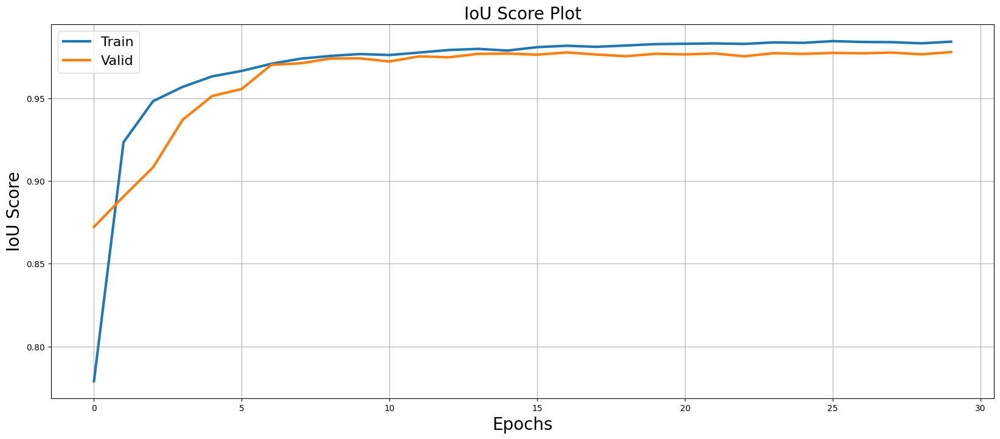

In [30]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.iou_score.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.iou_score.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('IoU Score', fontsize=20)
plt.title('IoU Score Plot', fontsize=20)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

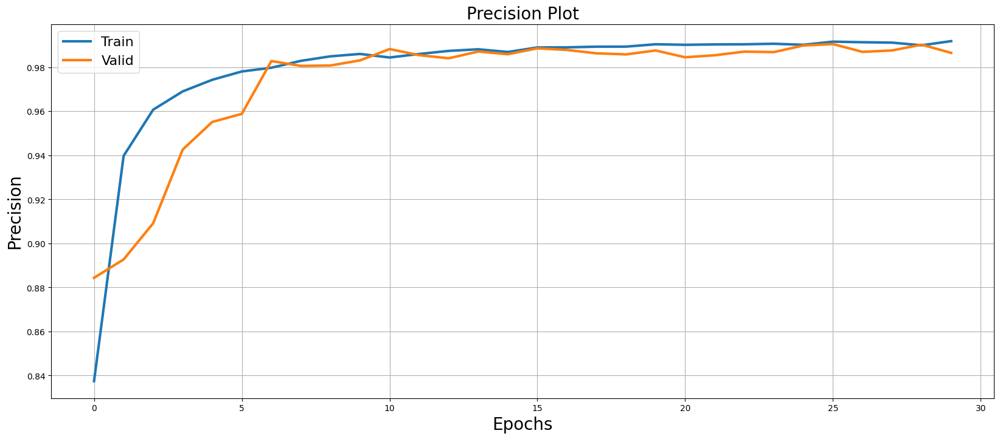

In [31]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.precision.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.precision.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('Precision', fontsize=20)
plt.title('Precision Plot', fontsize=20)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('precision_plot.png')
plt.show()

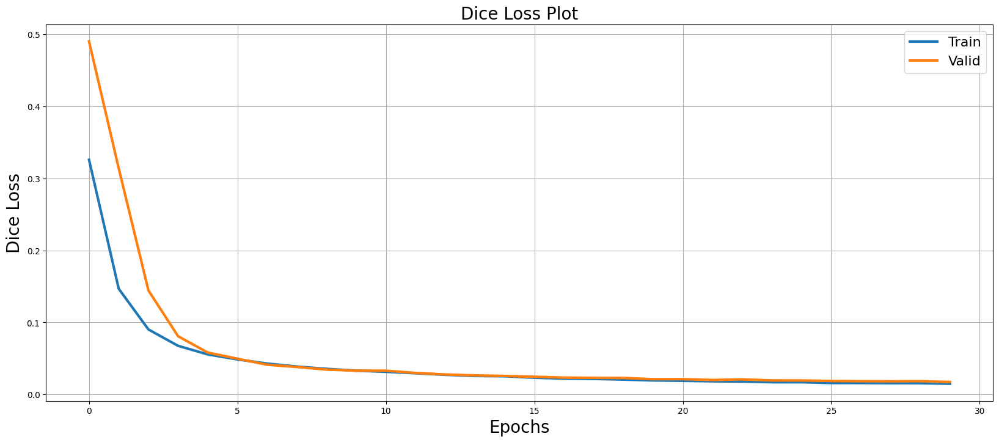

In [32]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.dice_loss.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.dice_loss.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('Dice Loss', fontsize=20)
plt.title('Dice Loss Plot', fontsize=20)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('dice_loss_plot.png')
plt.show()

# Teste da segmentação em uma imagem

In [33]:
caminho_imagens = [os.path.join(x_test_dir, image_id) for image_id in sorted(os.listdir(x_test_dir))]
caminho_imagens += [os.path.join(x_train_dir, image_id) for image_id in sorted(os.listdir(x_train_dir))]
caminho_imagens += [os.path.join(x_valid_dir, image_id) for image_id in sorted(os.listdir(x_valid_dir))]

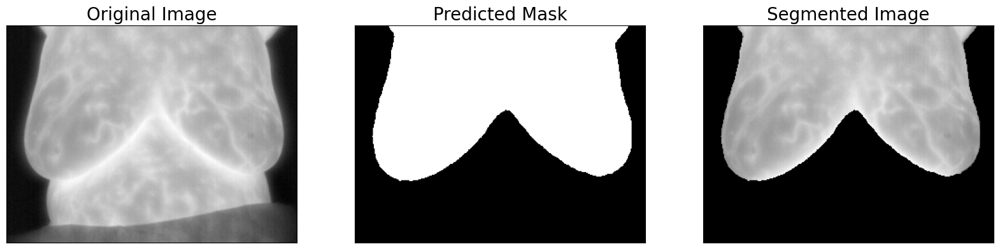

In [34]:
preprocessing = get_preprocessing(preprocessing_fn)

id = caminho_imagens[0].split('/')[-1]
image_original = cv2.cvtColor(cv2.imread(caminho_imagens[0]), cv2.COLOR_BGR2RGB)
image = preprocessing(image=image_original)['image']
x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)

pred_mask = best_model(x_tensor)
pred_mask = pred_mask.detach().squeeze().cpu().numpy().round().astype(int)

image_to_seg = cv2.imread(caminho_imagens[0], 0)
segmented_image = image_to_seg*pred_mask

visualize(
    original_image = image_original,
    predicted_mask = pred_mask,
    segmented_image = segmented_image
)